# Übung 6: Freistoß
**2er-Gruppenübung** - Abgabe: 01.09.2025, 23:59 Uhr

Abgabe bitte nur in __eines__ euer Repositories.

**Namen:** <br> 
*Prakunj Pratap Singh*<br>
*Helia Moradi* <br>
**Bearbeitungszeit:** *144 hours*

## Überblick
Bei einem Freistoß müssen die Gegner einen gewissen Mindestabstand zum Ball halten. Dieser wird im Fernsehen gerne ins Bild eingezeichnet, damit die Zuschauer die Einhaltung der Regel verfolgen können. Auch im Roboterfußball (RoboCup) gibt es den Mindestabstand beim Freistoß, er ist natürlich mit $75cm$ deutlich kleiner, ebenso wie der Ball mit $10cm$.

Auf diesem Übungsblatt wollen wir zunächst das Konzept und die Gleichungen und dann den Code entwickeln, um den Freistoßkreis in RoboCup-Bilder einzuzeichnen. Das System soll sich an den Linien auf dem Feld orientieren, wir betrachten hier aber nicht die Bildverarbeitung, um die Linien zu erkennen und zu identifizieren, sondern die 2D $\rightarrow$ 3D Rechnung dahinter. Die Lage der Linien und ihrer Ecken und Kreuzungen als Feldpunkte auf dem Spielfeld (in Metern) ist dabei bekannt, weil durch die Spielregeln vorgeschrieben.

Die Kamera befindet sich auf einem Stativ an einer unbekannten aber festen Position und kann auf dem Stativ schwenken, neigen und zoomen. In einem ersten Schritt sollen alle festen Parameter vorab bestimmt (kalibriert) werden. Dies passiert indem man die Kamera über das leere Feld schwenkt / zoomt und die Information aus den Bildpositionen erkannter Feldlinien ausnutzt. Im zweiten Schritt werden dann aus einem einzelnen Bild die variablen Parameter bestimmt.

<img src=resources/robocup-freistoss-result.jpg style="width:80%;">

*Eine Freistoßsituation im RoboCup. Die gegnerischen Roboter müssen mindestens $75cm$ vom Ball entfernt bleiben. Dies soll als Freistoßkreis ins Bild visualisiert werden. Dazu werden Feldpunkte und der Ball im Bild erkannt (nicht Teil der Aufgabe) und daraus die Schwenk- / Neige- / Zoomstellung und Ballposition berechnet.*

<img src=resources/field/field.png style="width:80%;">

*Das RoboCup-Feld mit markierten Punkten und Feldkoordinatensystem.*

<img src=resources/field/camera.png style="width:80%;">

*Die Kamera (symbolisch) mit Stativ, Lage des optischen Zentrums und Koordinatensystemen.*

## Aufgabe 14: Freistoß - Kalibrierung ($\sum$ 28P)


### Aufgabe 14.1: Gleichungen (10P)

In VL13a/Folie 6 ist die mathematische Struktur des n-Bild-Kalibrierungsproblems aus dem calibrate.ipynb-Notebook gegeben, so wie sie zur allgemeinen Least-Squares-Formel aus VL12b/Folie 14 passt.
Wir wollen dies nun für den oben gegebenen Kameraaufbau tun.

Letztendlich sollt ihr genau die Informationen liefern, die auf VL13a/Folie 6 stehen, aber hier nochmal als konkrete Fragen:
- Wie ist der Parametervektor aufgebaut, und welche Parameter gibt es?
- Welche davon sind statisch (d.h. Zugriffsfunktion hat nur Parameter $\mathbf{x}$) sind dynamisch (d.h. Zugriffsfunktion hat Parameter $\mathbf{x}$ und $i$)?
- Wie sehen die Zugriffsfunktionen (konkret mit Indizes!) aus?
  - Ihr dürft hier, damit es beim Übertragen nach Python keine Probleme gibt, auch mit 0 als Startindex arbeiten. Auf der Folie ist das anders, dort ist der erste Parameter $\mathbf{x}_1$ und der erste Bildindex $i=1$.
- Wie genau wird die Transformationsmatrix $\mathbf{T}_{F\leftarrow C}$ (von Kamera- in Feldkoordinaten) zusammengebaut? Hier liegt einer der Hauptunterschiede zu der n-Bild-Kalibrierung aus calibrate.ipynb.
  - Überlegt euch eine sinnvolle Transformationskette, bei der die einzelnen Transformationen sich einfach ablesen bzw. aus Parametern ausrechnen lassen.
  - Benennt insbesondere, welche Zwischenkoordinatensysteme es hier gibt, und benennt eine Transformation als $\mathbf{T}_{A\leftarrow B}$ wenn sie einen Punkt von $B$- nach $A$-Koordinaten abbildet (vgl. Vorlesung)
- Welche Struktur hat der Messvektor und damit das Ergebniss der Messfunktion $\mathbf{f}$?
- Welche Unsicherheit wird angenommen?
- Wie genau sieht die Messfunktion $\mathbf{f}$ aus?
  - Welches Verzerrungsmodell wird benutzt und warum?

**TODO**: Gleichungen aufstellen



### Aufgabe 14.2: Implementierung (18P)

Implementiere die Überlegungen aus Aufgabe 14.1 im hierunter stehenden Code. Es muss keine Erkennung der markanten Feldpunkte programmiert werden (z.B. mit einem CNN), diese Daten sind von Hand annotiert worden.

Die Programmstruktur ist sehr ähnlich zum calibrate.ipynb-Notebook, das wir in den letzten beiden Tutorien besprochen haben. Daher sind hier nicht alle Erklärung nochmal gegeben, sondern ihr solltet bei Unklarheiten dort nachsehen, insbesondere beim einfacheren Ein-Bild-Fall.
Allerdings ist die Einteilung in statische und dynamische Parameter hier anders (das solltet ihr in 14.1 schon festgestellt haben).

In [2]:
import numpy as np
import tensorflow as tf

import resources.uebung_6 as helpers


np.set_printoptions(suppress=True, precision=4)

In [3]:
# Prepare and load Dataset. The first run might take some time to download the Dataset (54MB).
# If dataset has been manually downloaded, set path
calibration_data, free_kick_data, image_format, num_of_calibration_points = helpers.prepare_and_load_robocup_dataset(
    path=None
)

Loaded 106 files into /home/prakunjpratapsingh/.keras/datasets/robocup-freistoss_extracted/robocup-freistoss
58 images, 547 points in the calibration dataset
42 images, 452 points in the freistoss dataset


I0000 00:00:1756754235.261751   56017 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5242 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


In [4]:
def convert_to_tensors(data_for_image):
    """Returns the data for a given image as a pair of tensors "in world" (xyzw) and "in image" (xy).

    :param data: A dictionary from point names to image/world point pairs ((xI, yI), (xW, yW, zW)).
    :return: A pair of TensorFlow float64 tensors (points_in_world, points_in_image).
        (num_of_points, 4), (num_of_points, 2)
    """
    points_for_image = data_for_image.values()
    points_in_world = tf.constant([[*data[1], 1] for data in points_for_image], dtype=tf.float64)
    points_in_image = tf.constant([data[0] for data in points_for_image], dtype=tf.float64)
    return points_in_world, points_in_image

/home/prakunjpratapsingh/.keras/datasets/robocup-freistoss_extracted/robocup-freistoss/calib-001.jpg


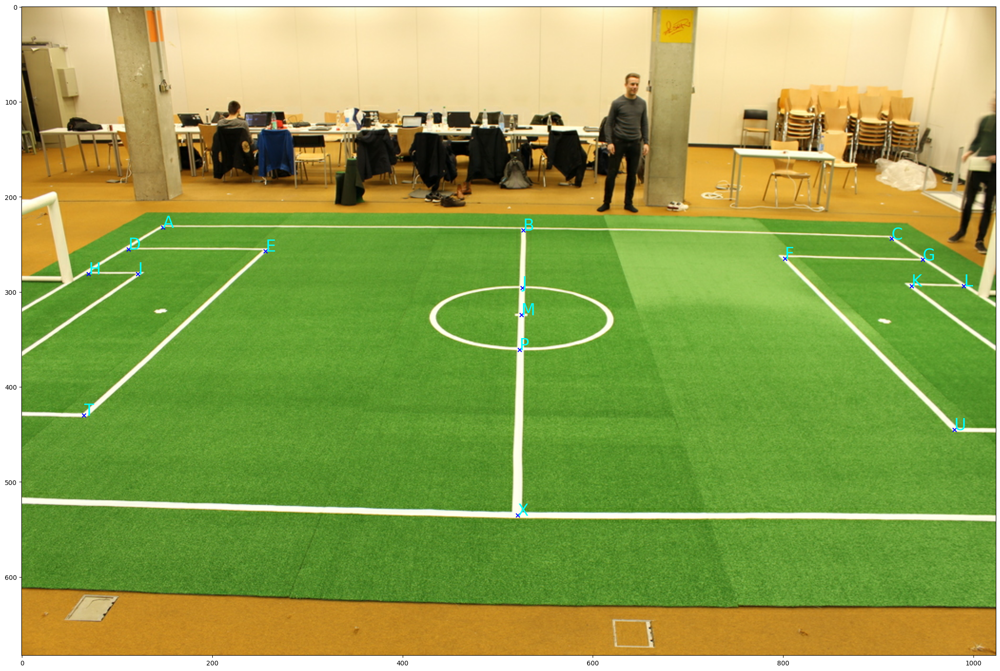

(<tf.Tensor: shape=(17, 4), dtype=float64, numpy=
array([[-4.5 ,  3.  ,  0.  ,  1.  ],
       [ 0.  ,  3.  ,  0.  ,  1.  ],
       [ 4.5 ,  3.  ,  0.  ,  1.  ],
       [-4.5 ,  2.  ,  0.  ,  1.  ],
       [-2.85,  2.  ,  0.  ,  1.  ],
       [ 2.85,  2.  ,  0.  ,  1.  ],
       [ 4.5 ,  2.  ,  0.  ,  1.  ],
       [-4.5 ,  1.1 ,  0.  ,  1.  ],
       [-3.9 ,  1.1 ,  0.  ,  1.  ],
       [ 0.  ,  0.75,  0.  ,  1.  ],
       [ 3.9 ,  1.1 ,  0.  ,  1.  ],
       [ 4.5 ,  1.1 ,  0.  ,  1.  ],
       [ 0.  ,  0.  ,  0.  ,  1.  ],
       [ 0.  , -0.75,  0.  ,  1.  ],
       [-2.85, -2.  ,  0.  ,  1.  ],
       [ 2.85, -2.  ,  0.  ,  1.  ],
       [ 0.  , -3.  ,  0.  ,  1.  ]])>, <tf.Tensor: shape=(17, 2), dtype=float64, numpy=
array([[148., 232.],
       [527., 235.],
       [914., 244.],
       [112., 255.],
       [256., 257.],
       [802., 265.],
       [947., 266.],
       [ 70., 281.],
       [122., 281.],
       [526., 296.],
       [935., 294.],
       [990., 294.],
       [525., 324

In [5]:
# Visualize data of the first image. This is done in a function so the global namespace is not polluted.
def check0():
    fname = list(calibration_data.keys())[0]
    print(fname)
    helpers.show_image_annotation(fname, calibration_data[fname])
    print(convert_to_tensors(calibration_data[fname]))


check0()

In [6]:
# TODO: Implement (2P)
class LSMultiImage(helpers.LSProblem):
    def __init__(self, data, image_format):
        """Constructor.

        :param data: A dictionary from filenames to point dictionaries, compatible to `convert_to_tensors`.
        :param image_format: The shape (height, width) of each image in the dataset.
        """
        # The list of all image file names that are part of the calibration.
        self.fnames = list(data.keys())
        self.data = data
        self.image_format = image_format
        # TODO: Implement
        world_list, image_list, kept = [], [], []
        for fname in self.fnames:
            w, im = convert_to_tensors(self.data[fname])
            n_pts = w.shape[0]
            if n_pts is None:
                n_pts = int(tf.shape(w)[0].numpy())
            if n_pts >= 8:
                world_list.append(w)
                image_list.append(im)
                kept.append(fname)

        self.fnames = kept
        self.points_in_field = world_list  # TODO: <- Change this
        # TODO: Call the constructor of the superclass:
        # super().__init__(points_in_image, uncertainty)

    
        super().__init__(measurement=image_list, uncertainty=tf.constant(0.2, tf.float64))


In [7]:
ls_multi = LSMultiImage(calibration_data, image_format)

### Parameterzugriff

Die folgenden Funktionen realisieren den Zugriff auf den Parametervektor.
Zur Referenz könnt ihr euch noch einmal `calibrate.ipynb` ansehen, wo für den Einbildfall Funktionsprototypen gegeben sind.
Die wesentlichen Überlegungen und Indexberechnungen solltet ihr schon in 14.1 angestellt haben.
Letztendlich sollte also dies also nur eine Umsetzung der Formeln aus 14.1 in Python-Code (zzgl. Initial Guess) sein.

In [8]:
# TODO: Implement (6P)

# @helpers.add_to_class(LSMultiImage)
# def get_...

# @helpers.add_to_class(LSMultiImage)
# def get_initial_guess(self):

@helpers.add_to_class(LSMultiImage)
def get_alpha(self, parameters, image_index=None):
    a = tf.cast(parameters[0], tf.float64)
    return tf.clip_by_value(a, 400.0, 520.0)


@helpers.add_to_class(LSMultiImage)
def get_k1(self, parameters, image_index=None):
    return tf.clip_by_value(tf.cast(parameters[1], tf.float64), -1e-4, 1e-4)


@helpers.add_to_class(LSMultiImage)
def get_camera_in_field_vector(self, parameters, image_index):
    start = 2 + 6*image_index
    end   = start + 6
    return tf.cast(parameters[start:end], tf.float64)

@helpers.add_to_class(LSMultiImage)
def combine(self, alpha, k1, *camera_in_field_vectors):
    alpha = tf.cast(alpha, tf.float64)[tf.newaxis]
    k1    = tf.cast(k1,    tf.float64)[tf.newaxis]
    pieces = [alpha, k1]
    for vi in camera_in_field_vectors:
        pieces.append(tf.reshape(tf.cast(vi, tf.float64), [-1]))
    return tf.concat(pieces, axis=0)

@helpers.add_to_class(LSMultiImage)
def get_initial_guess(self):
    alpha0 = tf.constant(400.0, tf.float64)   # start near truth, but UNSCALED (no tanh here)
    k10    = tf.constant(0.0,   tf.float64)
    zeros6 = [tf.zeros([6], tf.float64) for _ in self.fnames]
    return self.combine(alpha0, k10, *zeros6)




In [9]:
# TODO: Check
def check1():
    initial_guess = ls_multi.get_initial_guess()
    print(initial_guess)


check1()

tf.Tensor(
[400.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0. 

### Berechnung der Kamerapose

Der erste Schritt zum Messmodell ist eine Formel für $T_{F\leftarrow C}$. In diese Formel fließt folgendes ein:
- Alle geometrischen Sachverhalte bzgl. der Kamera
- Die Tatsache, dass ein Stativ verwendet wird und wie es funktioniert
- Die Lage des optischen Zentrums der Kamera in dem Aufbau mit dem Stativ (vgl. Bild am Anfang des Übungsblatts)
- Die Technik eine Rotation als Relativdrehung um einen Initialguess zu parametrisieren (vgl. VL12b "Schätzung von Posen")

Die Formel sollte schon in Aufgabe 14.1 entwickelt worden sein, hier wird sie nun implementiert.
Dazu stehen Dir einige Hilfsfunktionen aus dem uebung_6.py Paket zur Verfügung.
 - `helpers.translation`
 - `helpers.rotation_x`
 - `helpers.rotation_y`
 - `helpers.rotation_z`
 - `helpers.build_transform`

In [10]:
# TODO: Implement (4P)
@helpers.add_to_class(LSMultiImage)
def get_camera_in_field(self, parameters, image_index):
    """Returns the transformation "camera in field" computed from the relevant parts of the parameter vector.
    It uses an access function defined above to get a vector representation of the pose.

    :param parameters: The parameter vector (x). (num_of_parameters,)
    :param image_index: The index of the image for which the parameters are taken.
    :return: The transformation matrix. (4, 4)
    """
    # TODO: Implement
    # HINT: If you want to build a tensor from numbers and
    # some numbers are non-constants use tf.stack instead tf.constant.
    row0 = tf.stack([tf.constant(1.0, tf.float64), 0., 0., 0.])
    row1 = tf.stack([0., tf.constant(-1.0, tf.float64), 0., tf.constant(0.3, tf.float64)])
    row2 = tf.stack([0., 0., tf.constant(-1.0, tf.float64), tf.constant(0.6, tf.float64)])
    row3 = tf.stack([0., 0., 0., tf.constant(1.0, tf.float64)])
    T_base = tf.stack([row0, row1, row2, row3], axis=0)  

    v = self.get_camera_in_field_vector(parameters, image_index) 
    return T_base @ helpers.build_transform(v)


In [11]:
# TODO: Check if this is plausible
print(ls_multi.get_camera_in_field(ls_multi.get_initial_guess(), 0))
# TODO: Also copy the initial guess values here, change them a bit and try out
# if the change in camera_in_field is plausible
# This helps, because bugs in camera_in_field are hard to find in the final optimization
# print(ls_multi.get_camera_in_field(tf.constant([...], dtype=tf.float64), 0))

tf.Tensor(
[[ 1.   0.   0.   0. ]
 [ 0.  -1.   0.   0.3]
 [ 0.   0.  -1.   0.6]
 [ 0.   0.   0.   1. ]], shape=(4, 4), dtype=float64)


I0000 00:00:1756754240.066454   56017 cuda_solvers.cc:175] Creating GpuSolver handles for stream 0x11ed4640


In [12]:
# TODO: Check
# Test an example point at field origin.
# This should be close to the middle / lower part of the image
def check2():
    """Tests projection at initial guess for single point and tensor of points"""
    print(image_format)
    point_in_field = tf.constant([0, 0, 0, 1], dtype=tf.float64)
    camera_in_field = ls_multi.get_camera_in_field(ls_multi.get_initial_guess(), 0)
    print(helpers.project(point_in_field, camera_in_field, 400, image_format[1] / 2, image_format[0] / 2, 0))
    print(
        helpers.project(
            point_in_field[tf.newaxis, :], camera_in_field, 400, image_format[1] / 2, image_format[0] / 2, 0
        )
    )


check2()

(683, 1024, 3)
tf.Tensor([512.  541.5], shape=(2,), dtype=float64)
tf.Tensor([[512.  541.5]], shape=(1, 2), dtype=float64)


### Modellfunktion

In [13]:
# TODO: Implement (4P)
@helpers.add_to_class(LSMultiImage)
def model_function_single(self, parameters, image_index):
    """Computes the predicted measurement vector for a single image.

    :param parameters: The parameter vector (x). (num_of_parameters,)
    :param image_index: Index of the image for which to predict the measurement.
    :return: The predicted measurement vector given the model and parameters. (num_of_points_per_image, 2)
    """
    # TODO: Implement
    camera_in_field = self.get_camera_in_field(parameters, image_index)
    alpha = self.get_alpha(parameters, image_index)
    k1 = self.get_k1(parameters, image_index)
    u0, v0 = self.image_format[1] / 2, self.image_format[0] / 2
    points_in_image_pred = helpers.project(self.points_in_field[image_index], camera_in_field, alpha, u0, v0, k1)
    return points_in_image_pred


In [14]:
# TODO: Implement (2P)
@helpers.add_to_class(LSMultiImage)
def model_function(self, parameters):
    """Computes the list of predicted measurement vectors over all images.

    :param parameters: The parameter vector (x). (num_of_parameters,)
    :return: The predicted (list of) measurement vector(s) given the model and parameters. [(num_of_points_per_image, 2), ...]
    """
    # TODO: Implement
    # Hint: Use model_function_single for each image.
    return [self.model_function_single(parameters, i) for i in range(len(self.fnames))]


In [15]:
# Show an image with annotation and points projected according to model and initial guess
# This should look qualitatively correct, and the difference between annotation and projection should look
# like it could be resolved by moving and zooming.
# You can adjust the initial guess' position to make it fit better. For the rotation this is more difficult,
# since the matrix must stay orthogonal, just stick to +1/0/-1 as entries.
@helpers.add_to_class(LSMultiImage)
def predict_and_show(self, parameters, image_index):
    """Predicts the image points given the parameters and shows the result together with the ground truth.

    :param parameters: The parameter vector (x). (num_of_parameters,)
    :param image_index: The index of the image to show.
    """
    prediction = self.model_function_single(parameters, image_index)
    fname = self.fnames[image_index]
    helpers.show_image_annotation(fname, self.data[fname], prediction=prediction)

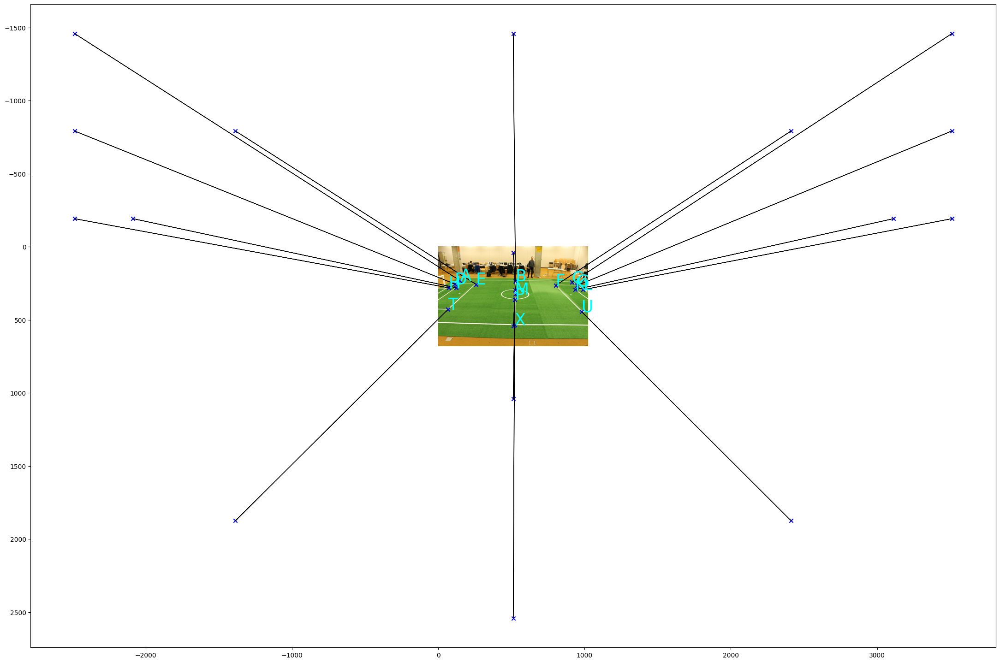

In [16]:
ls_multi.predict_and_show(ls_multi.get_initial_guess(), 0)

### Kalibrierung

In [17]:
# Do the optimization (this can take 5min for tracing before the first iteration starts)
estimated_parameters = ls_multi.fit()
print(f"x^= {estimated_parameters}")
print(f"rms: {ls_multi.rms(estimated_parameters).numpy()}")

 0 SUCCESS loss before 67037762813.1945, delta = 1.01825, loss after 42392150499.3565
 1 SUCCESS loss before 42392150499.3565, delta = 2.48991, loss after 17894770737.1552
 2 SUCCESS loss before 17894770737.1552, delta = 7.12764, loss after 3561890976.8819
 3 SUCCESS loss before 3561890976.8819, delta = 12.99296, loss after 719719661.7051
 4 SUCCESS loss before 719719661.7051, delta = 18.95266, loss after 249126539.4211
 5 FAILED  loss before 249126539.4211, delta = 49.25036, loss after nan
 5 SUCCESS loss before 249126539.4211, delta = 24.62518, loss after 208740153.2529
 6 FAILED  loss before 208740153.2529, delta = 155.50613, loss after nan
 6 FAILED  loss before 208740153.2529, delta = 77.75306, loss after nan
 6 FAILED  loss before 208740153.2529, delta = 38.87653, loss after 281867051.1106
 6 SUCCESS loss before 208740153.2529, delta = 19.43827, loss after 202974350.3805
 7 FAILED  loss before 202974350.3805, delta = 183.43740, loss after nan
 7 FAILED  loss before 202974350.3805

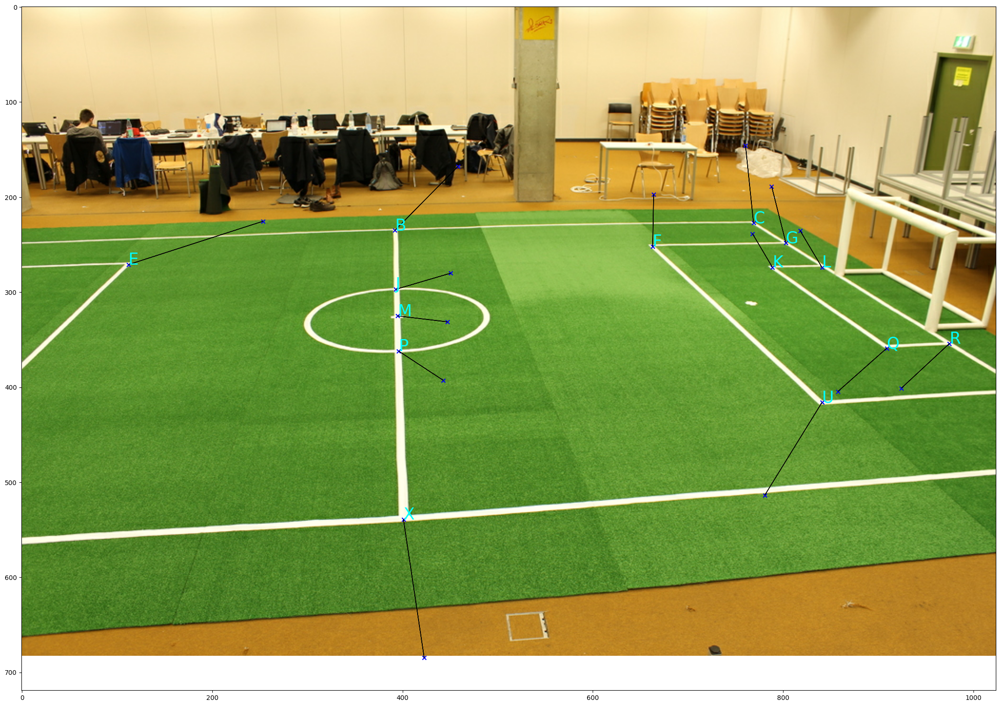

In [18]:
ls_multi.predict_and_show(estimated_parameters, 7)

## Aufgabe 15: Freistoß - Position des Balles ($\sum$ 14P)

Wir haben jetzt die statischen Parameter der Kamera auf dem Stativ kalibriert. Jetzt kommen wir zur eigentlichen Anwendung, nämlich die Position des Balles in einem Bild und der dynamischen Parameter der Kamera in dem Bild zu schätzen. Beides brauchen wir nämlich, um den Freistoßkreis ins Bild zu überlagern. Für die dynamischen Parameter der Kamera definieren wir wieder ein Least-Squares-Problem, bei dem wir diesmal aber die statischen Parameter aus der vorigen Multi-Bild-Kalibrierung übernehmen.

### Aufgabe 15.1: Gleichungen (5P)

Anstatt den Ball (wie im Tutoriumsbeispiel mit dem Roboter) durch Umkehrung der Kameragleichung ins Bild zu projizieren, nehmen wir hier einen anderen Weg: Wir benutzen die quadratische Ausgleichsrechnung als Gleichungslöser.
Dazu muss die Ballposition auf dem Feld Teil der Parameter werden (und es dementsprechend eine Zugriffsfunktion geben).

Erklärt hier, wie sich die oben beschriebene Methode auf die Gleichungen aus Aufgabe 14.1 auswirken (wieder nach dem Schema von VL13a/Folie 6).
Die Teile, die gleich bleiben (insb. Transformationskette und Kameragleichung) braucht ihr nicht erneut zu beschreiben.

Ihr könnt davon ausgehen, dass die Ballposition im Bild im Messvektor einen speziellen Index hat.
Außerdem könnt ihr unter dem Namen $\mathbf{x}_{\text{stat}}$ auf den Parametervektor zugreifen, der das Ergebnis der vorigen Kalibrierung war.
Der Ball hat den Radius $r$.

**TODO**: Gleichungen aufstellen



### Aufgabe 15.2: Implementierung (9P)

Der Ball ist auch schon Teil der Punktmenge in `data`, allerdings sind seine Feldkoordinaten dort `NaN`.
Wenn dies in der Modellfunktion (s.u.) geeignet behandelt wird, dann wird die Feld-Ballposition im Parametervektor im Laufe der Optimierung automatisch zum richtigen Wert konvergieren.

In [19]:
# TODO: Implement (1P)
class LSSingleImageWithBall(helpers.LSProblem):
    """Encapsulates the estimation problem for single image with ball"""

    def __init__(self, data, image_format, static_parameters, image_index=0):
        """Constructor.

        :param data: A dictionary from filenames to point dictionaries, compatible to `convert_to_tensors`.
        :param image_format: The shape (height, width) of each image in the dataset.
        :param static_parameters: The static parameters that were determined during calibration in the previous task.
        :param image_index: The index of the image within the dataset for which this problem is.
        """
        self.data = data
        self.image_format = image_format
        self.fname = list(data.keys())[image_index]
        self.static_parameters = static_parameters
        self.ball_radius = 0.1 / 2
        self.free_kick_radius = 0.75
        # TODO: Implement
        points_W, points_I = convert_to_tensors(self.data[self.fname])
        self.points_in_field = points_W  # TODO: <- Change this
        # Note: Call the constructor of the superclass:
        # super().__init__(points_in_image, uncertainty)

        super().__init__(measurement=points_I, uncertainty=tf.constant(1.0, tf.float64))


In [20]:
# TODO: Implement
# Here you need to decide which part of estimated_parameters needs to be passed to the constructor as "static parameters".
# ls_ball = LSSingleImageWithBall(free_kick_data, image_format, ...)
image_index = 9
ls_ball = LSSingleImageWithBall(
    free_kick_data,
    image_format,
    estimated_parameters[0:2],   
    image_index=image_index
)

Nun brauchen wir wieder Zugriffsfunktionen. Es sind im Prinzip dieselben wie bei der Kalibrierung, sie funktionieren nun allerdings anders.
Neu dazu kommt eine Funktion `get_ball_in_field`, die aus dem Parametervektor die (XYZW)-Position des Ballmittelpunkts auf dem Feld zusammenbastelt.
Diese muss unbedingt so heißen, denn sie wird neben außer in der von euch geschriebenen Modellfunktion auch im bereitgestellten `predict_and_show` aufgerufen, sonst funktioniert es also nicht.

In [21]:
# TODO: Implement (4P)

# At least the following to functions are required:

# @helpers.add_to_class(LSSingleImageWithBall)
# def get_ball_in_field(self, parameters):
#     ...

# @helpers.add_to_class(LSSingleImageWithBall)
# def get_initial_guess(self):
#     ...


@helpers.add_to_class(LSSingleImageWithBall)
def get_alpha(self, parameters=None):
    # alpha is the first static entry
    return tf.cast(self.static_parameters[0], tf.float64)



@helpers.add_to_class(LSSingleImageWithBall)
def get_k1(self, parameters=None):
    
    return tf.cast(self.static_parameters[1], tf.float64)


@helpers.add_to_class(LSSingleImageWithBall)
def get_static_pose_vector(self):
    return tf.zeros([6], tf.float64) 

@helpers.add_to_class(LSSingleImageWithBall)
def get_delta_pose_vector(self, parameters):
    
    return tf.cast(parameters[0:6], tf.float64)

@helpers.add_to_class(LSSingleImageWithBall)
def get_ball_in_field(self, parameters):
 
    XB = tf.cast(parameters[6], tf.float64)
    YB = tf.cast(parameters[7], tf.float64)
    ZB = tf.cast(self.ball_radius, tf.float64)  # ball touches ground
    return tf.stack([XB, YB, ZB, tf.constant(1.0, tf.float64)], axis=0)

@helpers.add_to_class(LSSingleImageWithBall)
def get_initial_guess(self):
 
    return tf.constant([0., 0., 0., 0., 0., 0., 0., 0.], tf.float64)

@helpers.add_to_class(LSSingleImageWithBall)
def get_camera_in_field(self, parameters):
 
    row0 = tf.stack([tf.constant(1.0, tf.float64), 0., 0., 0.])
    row1 = tf.stack([0., tf.constant(-1.0, tf.float64), 0., tf.constant(0.3, tf.float64)])
    row2 = tf.stack([0., 0., tf.constant(-1.0, tf.float64), tf.constant(0.6, tf.float64)])
    row3 = tf.stack([0., 0., 0., tf.constant(1.0, tf.float64)])
    T_base = tf.stack([row0, row1, row2, row3], axis=0)

    v_stat  = self.get_static_pose_vector()          # (6,) always
    v_delta = self.get_delta_pose_vector(parameters) # (6,)

    return T_base @ helpers.build_transform(v_stat) @ helpers.build_transform(v_delta)


Hier brauchen wir eine Zwischenvariante von `model_function`, die mit einer bestimmten Punktmenge rechnet, denn für die Berechnung des Kreises müssen Punkte vom Feld ins Bild projiziert werden, die nicht in den Daten waren. Diese ist sehr ähnlich zu `model_function_single` oben, daher gibt es wenig Punkte.

In [22]:
# TODO: Implement (2P)
@helpers.add_to_class(LSSingleImageWithBall)
def model_function_points(self, parameters, points_in_field):
    """Maps a set of points from field to image coordinates.

    :param parameters: The parameter vector (x). (num_of_parameters,)
    :param points_in_field: The points to be projected into the image. (num_of_points, 4)
    :return: The predicted points in the image. (num_of_points, 2)
    """
    # TODO: Implement
    T = self.get_camera_in_field(parameters)
    alpha = self.get_alpha()
    k1 = self.get_k1()
    u0, v0 = self.image_format[1] / 2, self.image_format[0] / 2
    return helpers.project(points_in_field, T, alpha, u0, v0, k1)


Die eigentliche Modellfunktion stützt sich im Wesentlichen auf `model_function_points`, muss aber behandeln, dass einer der Punkte in `self.points_in_field` der Ball ist.

In [23]:
# TODO: Implement (2P)
@helpers.add_to_class(LSSingleImageWithBall)
def model_function(self, parameters):
    """Computes the predicted measurement vector.

    :param parameters: The parameter vector (x). (num_of_parameters,)
    :return: The predicted measurement. (num_of_points, 2)
    """
    # Hint: self.points_in_field has NaN entries for the ball. At that point, you have to insert the ball position as given by the parameters.
    # Since this function will be compiled into a tf.function, this must be done without if-statements etc.
    # The function tf.where (in its 3-parameter form) is useful here.
    P = self.points_in_field
    ball = self.get_ball_in_field(parameters)        
    mask = tf.reduce_any(tf.math.is_nan(P), axis=1)    
    P_ball = tf.where(mask[:, None], tf.tile(ball[None, :], [tf.shape(P)[0], 1]), P)
    return self.model_function_points(parameters, P_ball)


In [24]:
@helpers.add_to_class(LSSingleImageWithBall)
def predict_and_show(self, parameters, with_circle=False):
    """Predicts the image points given the parameters and shows the result together with the ground truth.

    :param parameters: The parameter vector (x). (num_of_parameters,)
    :param with_circle: Whether a circle should be drawn around the ball.
    """
    prediction = self.model_function(parameters)
    circle_in_image = None
    if with_circle:
        center = self.get_ball_in_field(parameters)
        angles = tf.range(0, 2 * np.pi, 0.1, dtype=tf.float64)
        c0 = tf.zeros_like(angles)
        z_offset = -self.ball_radius * tf.ones_like(angles, dtype=tf.float64)

        circle_in_field = center + tf.stack(
            [tf.cos(angles) * self.free_kick_radius, tf.sin(angles) * self.free_kick_radius, z_offset, c0], axis=-1
        )
        circle_in_image = self.model_function_points(parameters, circle_in_field)
    helpers.show_image_annotation(self.fname, self.data[self.fname], prediction=prediction, circle=circle_in_image)

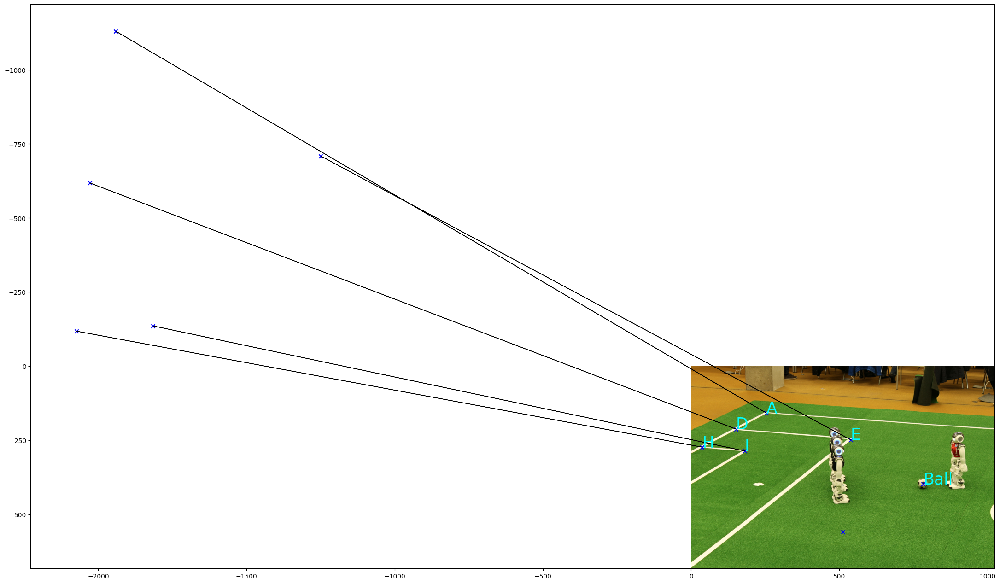

In [25]:
# TODO: Check that the results look plausible
ls_ball.predict_and_show(ls_ball.get_initial_guess())

Am Ende sollte eine rote Ellipse um den Ball gezeichnet werden, so dass dies einem Kreis auf dem Feld entspricht.
Ihr könnt es für verschiedene Bilder ausprobieren, indem ihr den `image_index`-Parameter in der folgenden Zelle setzt.

 0 SUCCESS loss before 24903306.7594, delta = 0.12699, loss after 15000668.9654
 1 SUCCESS loss before 15000668.9654, delta = 0.40742, loss after 5865192.6704
 2 SUCCESS loss before 5865192.6704, delta = 1.25480, loss after 821192.6713
 3 SUCCESS loss before 821192.6713, delta = 2.29303, loss after 76452.0618
 4 FAILED  loss before 76452.0618, delta = 4.26292, loss after 631011.0095
 4 SUCCESS loss before 76452.0618, delta = 2.13146, loss after 39679.6602
 5 SUCCESS loss before 39679.6602, delta = 0.77260, loss after 11098.5140
 6 SUCCESS loss before 11098.5140, delta = 0.12348, loss after 4293.2499
 7 SUCCESS loss before 4293.2499, delta = 0.03175, loss after 4265.9518
 8 SUCCESS loss before 4265.9518, delta = 0.00276, loss after 4265.8676
 9 SUCCESS loss before 4265.8676, delta = 0.00038, loss after 4265.8661
x^= [ 0.9634  0.1423 -0.0136 -3.0035  0.471  -0.1736 -2.0251  0.6938]
rms: 18.8544117946002


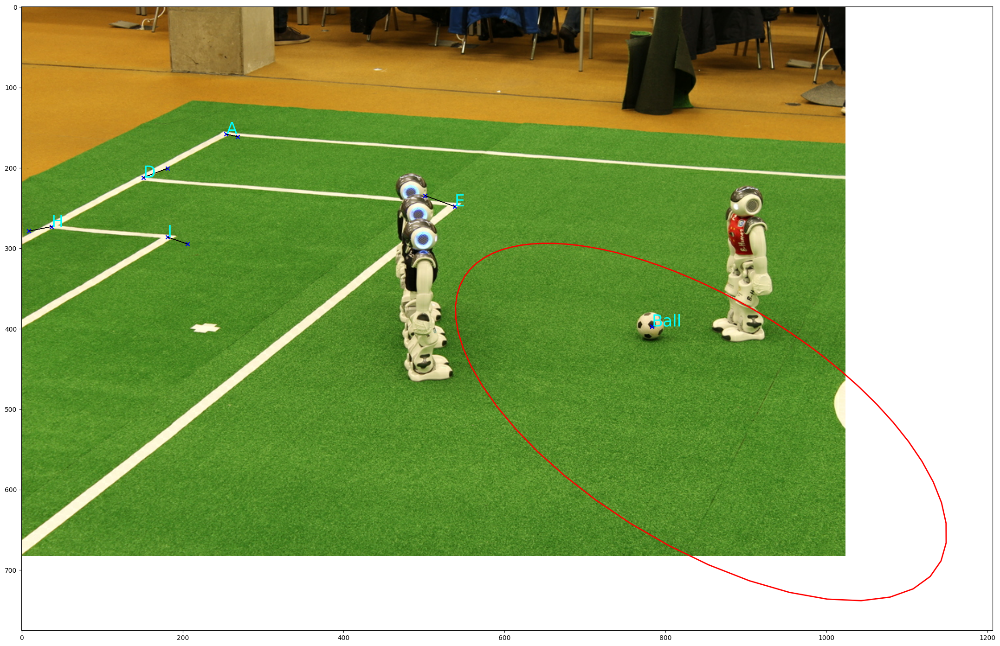

In [26]:
ls_ball = LSSingleImageWithBall(free_kick_data, image_format, estimated_parameters[0:4], image_index=9)
estimated_ball = ls_ball.fit()
print(f"x^= {estimated_ball}")
print(f"rms: {ls_ball.rms(estimated_ball).numpy()}")
ls_ball.predict_and_show(estimated_ball, with_circle=True)

### Bemerkung: Interessantes zum Abschluss
Ich habe vor Jahren beim ZDF nachgefragt, wie die Überlagerung in der Praxis funktioniert. Die dort verwendeten Kameras haben Sensoren für Schwenken, Neigen und Zoomen, d.h. zumindest im Livebetrieb wird keine Bildverarbeitung verwendet. Heutzutage werden die künstlichen Linien so überlagert, dass sie von Spielern korrekt überdeckt werden. Dazu muss man zusätzlich den Boden segmentieren und nur dort die Linie einblenden.

## Bonusaufgabe 16: Das Blaue vom Himmel (12BP)
Chromakeying (vgl. https://en.wikipedia.org/wiki/Chroma_key) ist eine gängige Filmtechnik, bei der eine physische Szene mit blauem oder grünem Hintergrund gefilmt wird $\left(\begin{smallmatrix} R_\text{in}&G_\text{in}&B_\text{in}\end{smallmatrix}\right)$ und ein Computerprogramm daraus ein freigestelltes Bild mit Transparenz (Alphakanal, RGBA) $\left(\begin{smallmatrix}\alpha_{\text{fg}}&R_\text{fg}&G_\text{fg}&B_\text{fg}\end{smallmatrix}\right)$  berechnet. 
Dieses kann dann auf die übliche Weise 

$$
\left(\begin{smallmatrix}\alpha_{\text{fg}}\\R_\text{fg}\\G_\text{fg}\\B_\text{fg}\end{smallmatrix}\right)
    = \text{Freistellen} \left(\begin{smallmatrix}R_\text{in}\\G_\text{in}\\B_\text{in}\end{smallmatrix}\right),
\quad
     \left(\begin{smallmatrix}R_\text{comp}\\G_\text{comp}\\B_\text{comp}\end{smallmatrix}\right)
     = \alpha_\text{fg} \left(\begin{smallmatrix}R_\text{fg}\\G_\text{fg}\\B_\text{fg}\end{smallmatrix}\right)
         + (1-\alpha_\text{fg}) \left(\begin{smallmatrix}R_\text{bg}\\G_\text{bg}\\B_\text{bg}\end{smallmatrix}\right)
$$
         
mit einem Hintergrundbild $\left(\begin{smallmatrix}R_\text{bg}&G_\text{bg}&B_\text{bg}\end{smallmatrix}\right)$ zu einem Kompositbild $\left(\begin{smallmatrix}R_\text{comp}&G_\text{comp}&B_\text{comp}\end{smallmatrix}\right)$ zusammengesetzt werden.

<img src=resources/foreground.jpg style="display:inline-block;width:45%;">
<img src=resources/composite.jpg style="display:inline-block;width:45%;">

*Vordergrundbild und zusammengesetztes Bild bei Chroma-Keying, Quelle: Burg Zahlenstein, https://www.youtube.com/watch?v=vGNPBTiF0mw*


Zwei der folgenden drei Bilder zeigen einen typischen Denkfehler bei einem Freistellungsalgorithmus. Die Bilder selbst zum genau Schauen findet ihr unter `resources/checkerboard_n.jpg`. 

- Beschreibe diese Fehler anschaulich und mit Bezug auf die Gleichung oben (je 2 Bonuspunkte)

<img src=resources/checkerboard_0.jpg style="display:inline-block;width:30%;">
<img src=resources/checkerboard_1.jpg style="display:inline-block;width:30%;">
<img src=resources/checkerboard_2.jpg style="display:inline-block;width:30%;">

Das Freistellen soll nun ein CNN erledigen, das auf Computergrafik-Daten trainiert werden soll. Dazu kann man z.B. computergrafisch mit Transparenz rendern und das resultierende Groundtruth-RGBA-Bild mit einem Foto eines leeren Blue/Greenscreens zum RGB-Eingabebild zusammensetzen. 

Für das Training braucht man ein Loss. Aber typische Losses, z.B. das Mean Absolute Error Loss haben ein für diesen Task spezifisches Problem.

- Beschreibe das Problem des MAE-Loss anschaulich und mit Bezug auf die Gleichung oben (4 Bonuspunkte)
- Definiere ein Loss, das dieses Problem löst (4 Bonuspunkte)